### IMPORT LIBRARIES


In [2]:
import requests
import matplotlib.pyplot as plt
import pandas as pd
import rasterio
from rasterio.mask import mask
import shapely.geometry as geo
import plotly.graph_objects as go
import numpy as np

### WELCOME TO 3D HOUSE PROJECT

In [3]:
print('Welcome to 3D House Modelling Project \nPlease enter your adress!')


Welcome to 3D House Modelling Project 
Please enter your adress!


#### NAME OF LISTS

In [4]:
xy_coordinate = []  # it keeps x, y coordinates
urls = [] # it keeps urls of DTM and DSM
polygon = [] # it keeps values of polygon


#### GET ADDRESS

In [5]:
def get_adress():    # this function is returning a address of desired house
    street_name = input('Enter your street name: ')
    house_number = int(input('Enter your house number: '))
    post_code = int(input('Enter your post code: '))
    
    adress ={'straatnaam':street_name ,
             'huisnummer':house_number , 
             'postcode': post_code}
    print('Address received')
    return adress

#### REQUEST THE INFORMATION OF X, Y and POLYGON VALUES WITH API
API address [API](https://docs.basisregisters.vlaanderen.be/docs/api-documentation.html#section/Technische-Info/Foutmeldingen)

In [6]:
def get_coordinate(): # this function is getting coordinate of house and polygon
    address = get_adress()
    
    # it request to get address informations
    response_API = requests.get('https://api.basisregisters.vlaanderen.be/v1/adresmatch', address).json()

    # it request to get address coordinates x,y 
    coordinates = response_API['adresMatches'][0]['adresPositie']['point']['coordinates']
    xy_coordinate.append(coordinates[0])
    xy_coordinate.append(coordinates[1])
   
    # it request to get address polygon
    gebouweenheden = requests.get(response_API['adresMatches'][0]['adresseerbareObjecten'][0]['detail']).json()
    gebouw = requests.get(gebouweenheden['gebouw']['detail']).json()
    polygon_list = gebouw['geometriePolygoon']['polygon']['coordinates'][0]
    
    
    for i in range(len(polygon_list)):
        polygon.append(polygon_list[i])
    
    print('Coordinates received')
    

    return polygon_list

#### GET POLYGON

Enter your street name: Lange Gasthuisstraat
Enter your house number: 21
Enter your post code: 2000
Address received
Coordinates received


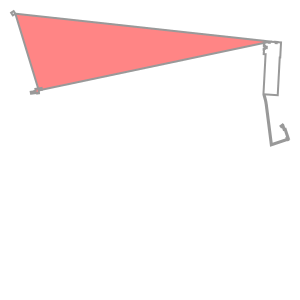

In [17]:
def get_polygon(): # this fuction creates a polygon from coordinates
    get_coordinate()
    poly = geo.Polygon(polygon)
    
    return poly
get_polygon()

#### READ .CSV

In [7]:
def read_csv(url: str): # this fuction read a csv file which is show the bounds of file
    get_coordinate()
    df = pd.read_csv(url) 
    
    # getting the related file number
    bound_file = df[(df['Left Bound'] < xy_coordinate[0]) & (df['Right Bound'] > xy_coordinate[0])
                 & ((df['Bottom Bound'] < xy_coordinate[1]) & (df['Top Bound'] > xy_coordinate[1]))]
    
    file_number = bound_file['File Number'].iloc[0]
    
    # getting related DSM url from csv 
    url_DSM = bound_file['Url DSM'].iloc[0]
    
    # getting related DTM url from csv 
    url_DTM = bound_file['Url DTM'].iloc[0]
        
    # adding these urls to a list
    urls.append(url_DSM)
    urls.append(url_DTM)
    
    print('Urls received from .csv')
    return file_number

#### GET CHM

In [8]:
def get_chm():
    
    print('Getting CHM')
    
    #polygon from the coordinate
    poly = geo.Polygon(polygon)
    
    print('Getting dsm .tif')
    with rasterio.open(urls[0]) as data_dsm:
        out_dsm, out_transform_dsm = mask(data_dsm, [poly], crop= True, nodata=None, filled=True, indexes = 1)
        
    print('Getting dtm .tif')
    with rasterio.open(urls[1]) as data_dtm:
        out_dtm, out_transform_dtm = mask(data_dtm, [poly], crop= True, nodata=None, filled=True, indexes = 1 )
    
    #Getting CHM 
    CHM = out_dsm - out_dtm
    
    return CHM
    
    
   

#### 3D AXES

In [9]:
def get_figure(address_csv : str):
    
    # calling function of def read_csv(url: str):
    read_csv(address_csv)
    
    
    fig = go.Figure(data=go.Surface (z= get_chm() , opacity=0.8, colorscale='geyser'))
                  

    fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='Z'),
                    width=700,
                    height = 700
                  )

    return fig.show()

#### MAIN

In [12]:
# giving a path to connect to .csv file

path = 'list_of_bounds.csv'

In [18]:
# only function to run the project
get_figure(path)

Enter your street name: Lange Gasthuisstraat
Enter your house number: 21
Enter your post code: 2000
Address received
Coordinates received
Urls received from .csv
Getting CHM
Getting dsm .tif
Getting dtm .tif
